In [5]:
import pandas as pd
import altair as alt
import math

In [2]:
alt.data_transformers.enable('default', max_rows=None) 
alt.renderers.enable('notebook')

RendererRegistry.enable('notebook')

In [3]:
df = pd.read_csv('https://gist.githubusercontent.com/andriy-gazin/f8f74625aeb3602850067fbb47bc1e4f/raw/05e5080840396deb084e90208dc8e76a75a980a3/pitchfork.csv')
df.head()

,artist,album,genre,primary,score,date,author,role
0,David Byrne,“…The Best Live Show of All Time” — NME EP,Rock,Rock,5.5,2019-01-11,Andy Beta,Contributor
1,DJ Healer,Lost Lovesongs / Lostsongs Vol. 2,Electronic,Electronic,6.2,2019-01-11,Chal Ravens,Contributor
2,Jorge Velez,Roman Birds,Electronic,Electronic,7.9,2019-01-10,Philip Sherburne,Contributing Editor
3,Chandra,Transportation EPs,Rock,Rock,7.8,2019-01-10,Andy Beta,Contributor
4,The Chainsmokers,Sick Boy,Electronic,Electronic,3.1,2019-01-09,Larry Fitzmaurice,Contributor


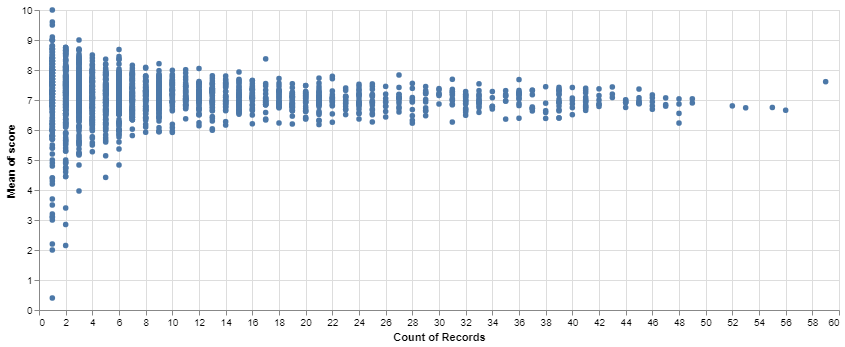

In [4]:
alt.Chart(df).mark_circle().encode(
    detail = alt.Detail(['yearmonth(date)', 'primary']),
    x = alt.X('count()'),
    y = alt.Y('score', aggregate='mean', scale = alt.Scale(zero=False)),
).properties(width = 800)

In [ ]:
artists = df['artist'].unique()
avg_albums_per_artist = 0

for artist in artists:
    avg_albums_per_artist += len(df.loc[df['artist'] == artist])
avg_albums_per_artist = math.ceil(avg_albums_per_artist / len(artists))

avg_score = []
for artist in artists:
    artists_albums = df.loc[df['artist'] == artist]
    if len(artists_albums) > avg_albums_per_artist:
        avg_score.append(round(int(artists_albums.sum()['score']) / len(artists_albums), 1))
new_df = pd.DataFrame(list(zip(artists, avg_score)), columns = ["Artist", "Score"]).sort_values(by=['Score'], ascending=False)
alt.Chart(new_df[:10]).mark_bar().encode(
    x = alt.X('Artist:N'),
    y = alt.Y('Score:Q', sort=alt.Sort(op='Artist',  order='descending'))
)

In [18]:
db = df.loc[df['artist'] == 'David Byrne']
len(db)

7

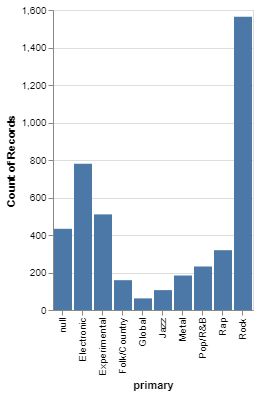

In [6]:
alt.Chart(df).mark_bar().encode(
    x = alt.X('primary:N'),
    y = alt.Y('count():Q')
).transform_filter(
    'datum.score >= 8'
)

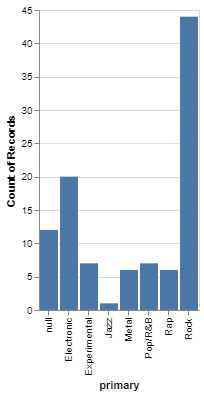

In [7]:
alt.Chart(df).mark_bar().encode(
    x = alt.X('primary:N'),
    y = alt.Y('count():Q')
).transform_filter(
    'datum.score <= 2'
)

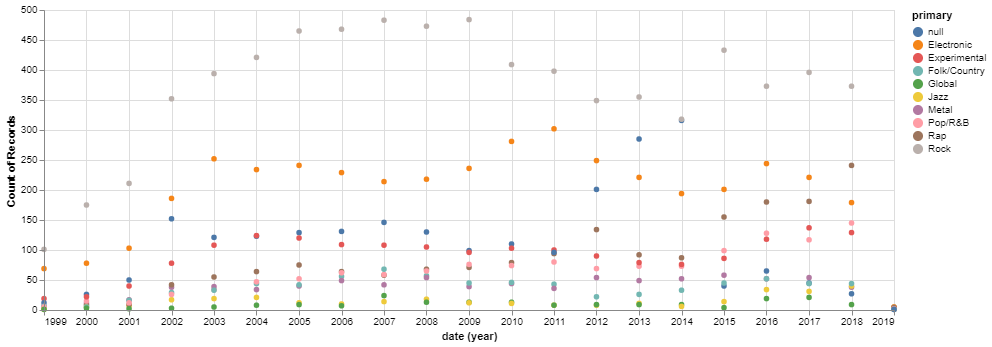

In [11]:
alt.Chart(df).mark_circle().encode(
    x = alt.X('date:T', timeUnit='year'),
    y = alt.Y('count()'),
    color = alt.Color('primary')
).properties(width = 850)